In [1]:
!pip install -U peft diffusers transformers accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 556.4/556.4 kB 12.5 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 60.5 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 124.9 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.9/380.9 kB 24.9 MB/s eta 0:00:00
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.35.2
    Uninstalling diffusers-0.35.2:
      Successfully uninstalled diffusers-0.35.2
  Attempting uninstall: transformers
    Found existing installation: transformers 4.57.1
    Uninstalling transformers-4.57.1:
      Successfully uninstalled transformers-4.57.1
  Attempting uninstall: accelerate
    Found existing installation: accelerate 1.11.0
    Uninstalling accelerate-1.11.0:
      Successfully uninstalled accelerate-1.11.0
  Attempting uninstall: peft
    Found existing installation

In [2]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
from diffusers import (
    KandinskyV22PriorPipeline, 
    KandinskyV22Img2ImgPipeline,
    AutoencoderKL
)
from diffusers.utils import load_image

# Configuration
dtype = torch.float16
device = "cuda"

print("Loading Models (this may take a minute)...")

# 1. CLIP Prior (For semantic embeddings)
prior_pipe = KandinskyV22PriorPipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-prior", torch_dtype=dtype
)
prior_pipe.enable_model_cpu_offload()

# 2. Kandinsky Decoder (The generative engine)
decoder_pipe = KandinskyV22Img2ImgPipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder", torch_dtype=dtype
)
decoder_pipe.enable_model_cpu_offload()

# 3. Stable Diffusion VAE (The MindEye structural bottleneck)
vae = AutoencoderKL.from_pretrained(
    "runwayml/stable-diffusion-v1-5", 
    subfolder="vae", 
    torch_dtype=dtype
).to(device)

2025-12-20 17:12:34.002267: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766250754.198216      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766250754.252271      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1766250754.700150      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766250754.700190      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766250754.700193      55 computation_placer.cc:177] computation placer alr

Loading Models (this may take a minute)...


model_index.json:   0%|          | 0.00/501 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/315 [00:00<?, ?B/s]

image_encoder/model.safetensors:   0%|          | 0.00/3.69G [00:00<?, ?B/s]

prior/diffusion_pytorch_model.safetensor(…):   0%|          | 0.00/4.10G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model_index.json:   0%|          | 0.00/250 [00:00<?, ?B/s]

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/317 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

movq/diffusion_pytorch_model.safetensors:   0%|          | 0.00/271M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.01G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [3]:
def get_semantic_embeddings(pil_image):
    """Path A: High-level semantic extraction (CLIP)"""
    pixel_values = prior_pipe.image_processor(pil_image, return_tensors="pt").pixel_values.to(device, dtype=dtype)
    with torch.no_grad():
        image_emb = prior_pipe.image_encoder(pixel_values).image_embeds
    return image_emb

def get_structural_anchor(pil_image):
    """Path B: Low-level structural bottleneck (SD VAE)"""
    # Preprocess for VAE
    img_tensor = decoder_pipe.image_processor.preprocess(pil_image).to(device, dtype=dtype)
    
    with torch.no_grad():
        # Encode to latents (The MindEye 'brain' representation)
        latents = vae.encode(img_tensor).latent_dist.mode()
        # Decode back to pixels to create the spatial mask/anchor
        anchor_tensor = vae.decode(latents).sample
        anchor_pil = decoder_pipe.image_processor.postprocess(anchor_tensor, output_type="pil")[0]
    return anchor_pil

def get_negative_signal(prompt="blue tint, cold colors, low quality, blurry"):
    """Corrective signal to prevent color drift"""
    with torch.no_grad():
        neg_out = prior_pipe(prompt=prompt, num_inference_steps=20)
    return neg_out.image_embeds

Extracting MindEye pathways...


  0%|          | 0/20 [00:00<?, ?it/s]

Reconstructing with Strength 0.55...


  0%|          | 0/16 [00:00<?, ?it/s]

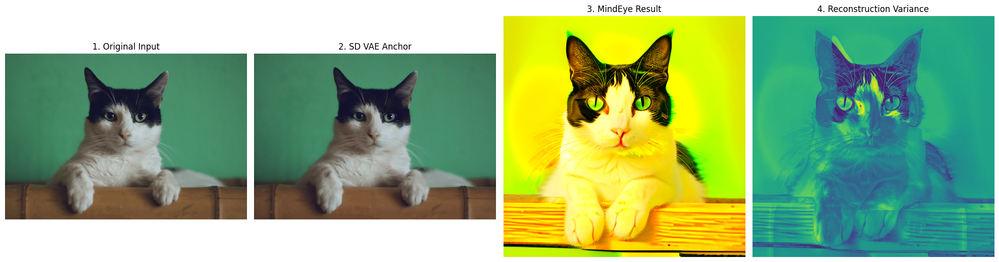

In [4]:
# 1. Load Image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
input_image = load_image(url).convert("RGB")

# 2. Extract Dual-Path Information
print("Extracting MindEye pathways...")
high_level_emb = get_semantic_embeddings(input_image)
low_level_anchor = get_structural_anchor(input_image)
neg_emb = get_negative_signal()

# 3. Execute Reconstruction
# Strength 0.5-0.6 provides the best 'hallucination' balance
STRENGTH = 0.55 
print(f"Reconstructing with Strength {STRENGTH}...")

final_output = decoder_pipe(
    image=low_level_anchor,          # Starting from the SD VAE structure
    image_embeds=high_level_emb,     # Guided by CLIP semantics
    negative_image_embeds=neg_emb,   # Pushing away from blue drift
    strength=STRENGTH,
    guidance_scale=12.0,             # High guidance to enforce the CLIP concept
    num_inference_steps=30
).images[0]

# 4. Corrected Display Logic Flow
plt.figure(figsize=(20, 6))

# Ensure original is resized to match generated size for math comparison
input_resized = input_image.resize((512, 512))

# Convert to tensors for math
orig_tensor = torch.tensor(list(input_resized.getdata()), dtype=torch.float32)
gen_tensor = torch.tensor(list(final_output.getdata()), dtype=torch.float32)

# Calculate Variance (Difference)
# This shows exactly where the AI "hallucinated" new details vs kept original
diff = torch.abs(orig_tensor - gen_tensor).mean(dim=1).reshape(512, 512)

plt.subplot(1, 4, 1); plt.imshow(input_image); plt.title("1. Original Input"); plt.axis("off")
plt.subplot(1, 4, 2); plt.imshow(low_level_anchor); plt.title("2. SD VAE Anchor"); plt.axis("off")
plt.subplot(1, 4, 3); plt.imshow(final_output); plt.title("3. MindEye Result"); plt.axis("off")
plt.subplot(1, 4, 4); plt.imshow(diff, cmap='viridis'); plt.title("4. Reconstruction Variance"); plt.axis("off")

plt.tight_layout()
plt.show()

# Get the COCO dataset Images

In [20]:
from torch.utils.data import Dataset, DataLoader, Subset
import h5py
import numpy as np


# ============================================================================
# SECTION 1: DOWNLOAD MANAGER
# ============================================================================
def get_dataset_paths():
    """Download the 3 critical components from HuggingFace"""
    print("Downloading files from HuggingFace...")
    repo = "pscotti/mindeyev2"
    
    betas_path = hf_hub_download(
        repo_id=repo, 
        filename="betas_all_subj01_fp32_renorm.hdf5", 
        repo_type="dataset"
    )
    
    images_path = hf_hub_download(
        repo_id=repo, 
        filename="coco_images_224_float16.hdf5", 
        repo_type="dataset"
    )
    
    behav_path = hf_hub_download(
        repo_id=repo, 
        filename="COCO_73k_subj_indices.hdf5", 
        repo_type="dataset"
    )
    
    print("✓ Files downloaded successfully")
    return betas_path, images_path, behav_path

In [15]:
class MindEyeDataset(Dataset):
    def __init__(self, betas_file, images_file, behav_file, 
                 subject='subj01', transform=None):
        """
        Args:
            betas_file: Path to fMRI betas HDF5
            images_file: Path to images HDF5
            behav_file: Path to behavior/indices HDF5
            subject: Subject ID (default: 'subj01')
            transform: Optional image transforms (for CLIP preprocessing)
        """
        # Store paths instead of file handles (for multiprocessing)
        self.betas_path = betas_file
        self.images_path = images_file
        self.transform = transform
        
        # Load metadata (image indices for each trial)
        with h5py.File(behav_file, 'r') as f:
            self.behav_indices = f[subject][:]
        
        # File handles will be opened per-worker in __getitem__
        self._betas_file = None
        self._images_file = None
        
        print(f"Dataset initialized: {len(self.behav_indices)} trials")
    
    def _ensure_files_open(self):
        """Lazy open files (called in __getitem__)"""
        if self._betas_file is None:
            self._betas_file = h5py.File(self.betas_path, 'r')
            self._images_file = h5py.File(self.images_path, 'r')
    
    def __len__(self):
        return len(self.behav_indices)
    
    def __getitem__(self, idx):
        # Ensure files are open (lazy initialization per worker)
        self._ensure_files_open()
        
        # OPTIMIZED: Direct access to open files (very fast!)
        fmri_data = self._betas_file['betas'][idx]
        
        # Get image ID (direct mapping: behav_indices = cocoidx)
        image_id = self.behav_indices[idx]
        
        # Load image using cocoidx
        image_data = self._images_file['images'][image_id]
        
        # Convert to tensors
        fmri_tensor = torch.tensor(fmri_data, dtype=torch.float32)
        
        
        image_tensor = torch.tensor(image_data, dtype=torch.float32)
        
        # Apply transforms if provided (for CLIP)
        if self.transform:
            image_tensor = self.transform(image_tensor)
        
        return {
            'fmri': fmri_tensor,      # (15724,)
            'image': image_tensor,     # (3, 224, 224) in [0, 1]
            'image_id': image_id,      # COCO image ID (0-72999)
            'trial_idx': idx           # Trial index (0-29999 for subj01)
        }
    
    def __del__(self):
        """Close HDF5 files when dataset is destroyed"""
        if self._betas_file is not None:
            self._betas_file.close()
        if self._images_file is not None:
            self._images_file.close()

In [18]:
from huggingface_hub import hf_hub_download

# ===== STEP 1: Download Data =====
betas_path, images_path, behav_path = get_dataset_paths()

# ===== STEP 2: Create Dataset =====
dataset = MindEyeDataset(
    betas_file=betas_path,
    images_file=images_path,
    behav_file=behav_path
)

✓ Files downloaded successfully
Dataset initialized: 30000 trials



=== Dataset Split ===
Train: 8000 images, 24000 trials
Val:   2000 images, 6000 trials
Repetitions per image: ~3.0


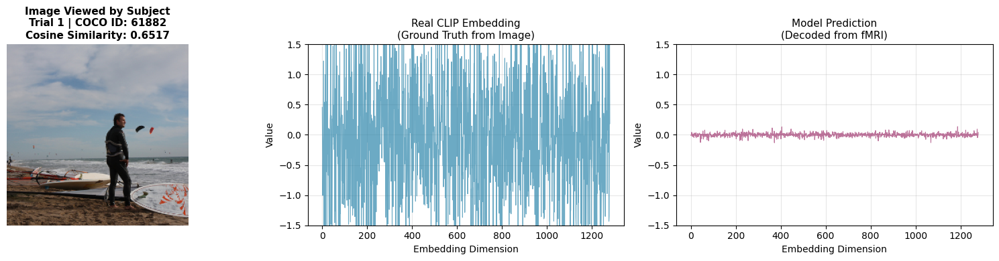

Validation Index: 0 → Dataset Trial: 1
Image ID: 61882
Cosine Similarity: 0.6517
Real CLIP  → Mean: -0.0413, Std: 1.1348, Norm: 40.6250
Predicted  → Mean: -0.0003, Std: 0.0286, Norm: 1.0226


SHOWING 3 RANDOM VALIDATION SAMPLES



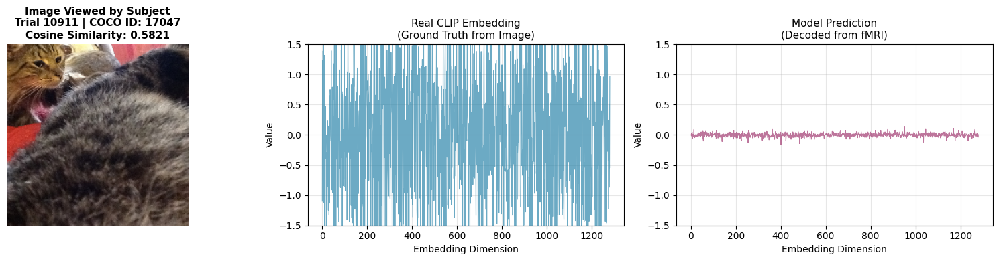

Validation Index: 1556 → Dataset Trial: 10911
Image ID: 17047
Cosine Similarity: 0.5821
Real CLIP  → Mean: -0.0002, Std: 1.2070, Norm: 43.1875
Predicted  → Mean: -0.0009, Std: 0.0286, Norm: 1.0237



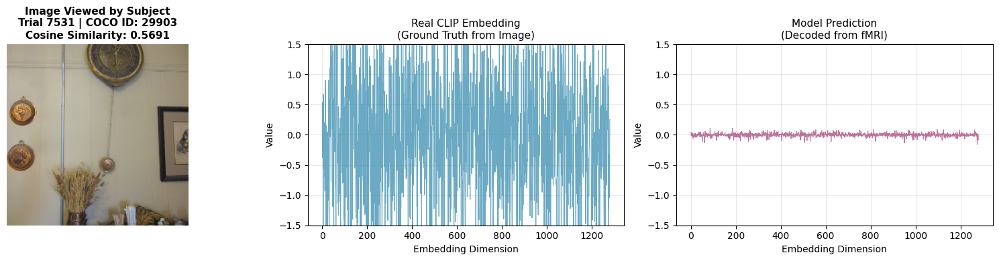

Validation Index: 2674 → Dataset Trial: 7531
Image ID: 29903
Cosine Similarity: 0.5691
Real CLIP  → Mean: -0.0399, Std: 1.2432, Norm: 44.4688
Predicted  → Mean: -0.0008, Std: 0.0294, Norm: 1.0524



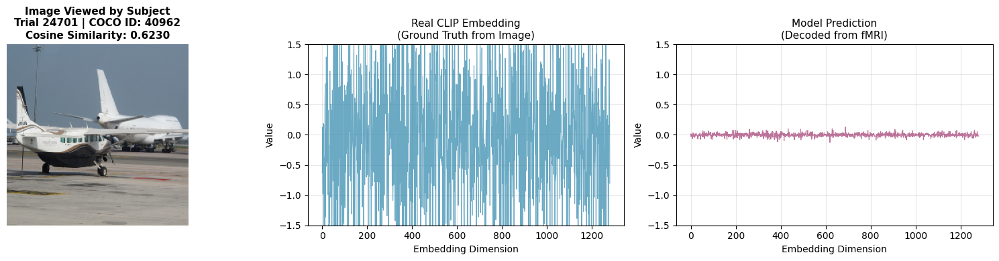

Validation Index: 5243 → Dataset Trial: 24701
Image ID: 40962
Cosine Similarity: 0.6230
Real CLIP  → Mean: -0.0286, Std: 1.1172, Norm: 39.9688
Predicted  → Mean: -0.0015, Std: 0.0283, Norm: 1.0150



In [21]:
# ============================================================================
# RECREATE TRAIN/VAL SPLIT (needed to map indices correctly)
# ============================================================================
from collections import defaultdict

def create_splits(dataset, train_ratio=0.8, seed=42):
    """
    Split by IMAGE ID to avoid data leakage from repetitions
    
    Returns:
        train_indices, val_indices: Lists of trial indices
    """
    np.random.seed(seed)
    
    # Group trials by image_id
    image_to_trials = defaultdict(list)
    for idx in range(len(dataset)):
        image_id = dataset.behav_indices[idx]
        image_to_trials[image_id].append(idx)
    
    # Split at IMAGE level (not trial level!)
    unique_images = list(image_to_trials.keys())
    np.random.shuffle(unique_images)
    
    n_train_images = int(len(unique_images) * train_ratio)
    train_images = set(unique_images[:n_train_images])
    val_images = set(unique_images[n_train_images:])
    
    # Collect trial indices
    train_indices = []
    val_indices = []
    
    for image_id, trial_list in image_to_trials.items():
        if image_id in train_images:
            train_indices.extend(trial_list)
        else:
            val_indices.extend(trial_list)
    
    print(f"\n=== Dataset Split ===")
    print(f"Train: {len(train_images)} images, {len(train_indices)} trials")
    print(f"Val:   {len(val_images)} images, {len(val_indices)} trials")
    print(f"Repetitions per image: ~{len(train_indices)/len(train_images):.1f}")
    
    return train_indices, val_indices

# Create the split (use same seed as training: 42)
train_indices, val_indices = create_splits(dataset, train_ratio=0.8, seed=42)

# ============================================================================
# NOW LOAD THE EMBEDDINGS
# ============================================================================
clip_embeddings = torch.load('/kaggle/input/kandinsky-embeddings-truth/kandinsky_embeddings_subj01.pt')
model_data = torch.load('/kaggle/input/kandinsky-embeddings-model/model_outputs_kandinsky.pt')
predicted_embeddings = model_data['embeddings']
predicted_image_ids = model_data['ids']

# ============================================================================
# VISUALIZATION FUNCTION
# ============================================================================
def show_image_with_clip_comparison(val_idx, dataset, val_indices, 
                                    clip_embeddings, predicted_embeddings):
    """
    Show an image with both real CLIP embedding and model's prediction
    
    Args:
        val_idx: Index into validation set (0 to len(val_dataset)-1)
        dataset: Full MindEyeDataset
        val_indices: List of validation trial indices
        clip_embeddings: Real CLIP embeddings (30000, 768)
        predicted_embeddings: Model predictions (n_val, 768)
    """
    # Map validation index to actual dataset index
    actual_trial_idx = val_indices[val_idx]
    
    # Get sample
    sample = dataset[actual_trial_idx]
    
    # Get embeddings
    real_clip = clip_embeddings[actual_trial_idx]  # (768,)
    pred_clip = predicted_embeddings[val_idx]       # (768,)
    
    # Compute cosine similarity
    real_norm = real_clip / real_clip.norm()
    pred_norm = pred_clip / pred_clip.norm()
    cosine_sim = (real_norm * pred_norm).sum().item()
    
    # ========== VISUALIZATION ==========
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    
    # 1. Show the image
    axes[0].imshow(sample['image'].permute(1, 2, 0).numpy())
    axes[0].set_title(f"Image Viewed by Subject\n"
                      f"Trial {actual_trial_idx} | COCO ID: {sample['image_id']}\n"
                      f"Cosine Similarity: {cosine_sim:.4f}", 
                      fontsize=11, fontweight='bold')
    axes[0].axis('off')
    
    # 2. Real CLIP embedding
    axes[1].plot(real_clip.numpy(), alpha=0.7, linewidth=0.8, color='#2E86AB')
    axes[1].set_title("Real CLIP Embedding\n(Ground Truth from Image)", fontsize=11)
    axes[1].set_xlabel("Embedding Dimension")
    axes[1].set_ylabel("Value")
    axes[1].grid(True, alpha=0.3)
    axes[1].set_ylim([-1.5, 1.5])
    
    # 3. Predicted CLIP embedding
    axes[2].plot(pred_clip.numpy(), alpha=0.7, linewidth=0.8, color='#A23B72')
    axes[2].set_title("Model Prediction\n(Decoded from fMRI)", fontsize=11)
    axes[2].set_xlabel("Embedding Dimension")
    axes[2].set_ylabel("Value")
    axes[2].grid(True, alpha=0.3)
    axes[2].set_ylim([-1.5, 1.5])
    
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"{'='*70}")
    print(f"Validation Index: {val_idx} → Dataset Trial: {actual_trial_idx}")
    print(f"Image ID: {sample['image_id']}")
    print(f"Cosine Similarity: {cosine_sim:.4f}")
    print(f"Real CLIP  → Mean: {real_clip.mean():.4f}, Std: {real_clip.std():.4f}, Norm: {real_clip.norm():.4f}")
    print(f"Predicted  → Mean: {pred_clip.mean():.4f}, Std: {pred_clip.std():.4f}, Norm: {pred_clip.norm():.4f}")
    print(f"{'='*70}\n")


# ============================================================================
# USAGE EXAMPLES
# ============================================================================

# Show first validation sample
show_image_with_clip_comparison(
    val_idx=0,
    dataset=dataset,
    val_indices=val_indices,
    clip_embeddings=clip_embeddings,
    predicted_embeddings=predicted_embeddings
)

# Show multiple random validation samples
import random
print("\n" + "="*70)
print("SHOWING 3 RANDOM VALIDATION SAMPLES")
print("="*70 + "\n")

for i in range(3):
    random_idx = random.randint(0, len(val_indices)-1)
    show_image_with_clip_comparison(
        val_idx=random_idx,
        dataset=dataset,
        val_indices=val_indices,
        clip_embeddings=clip_embeddings,
        predicted_embeddings=predicted_embeddings
    )

Reconstructing from Real CLIP embedding...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Reconstructing from Predicted CLIP embedding (fMRI)...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

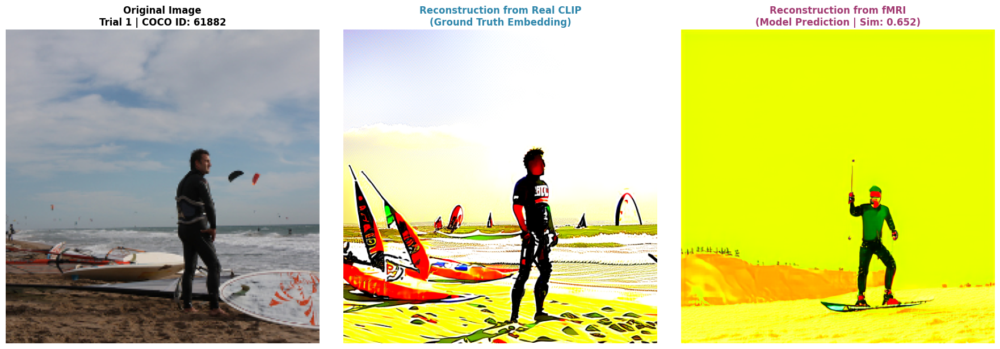

Validation Index: 0 → Dataset Trial: 1
Image ID: 61882
Cosine Similarity (Real vs Predicted CLIP): 0.6517


SHOWING 3 RANDOM RECONSTRUCTIONS

Reconstructing from Real CLIP embedding...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Reconstructing from Predicted CLIP embedding (fMRI)...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

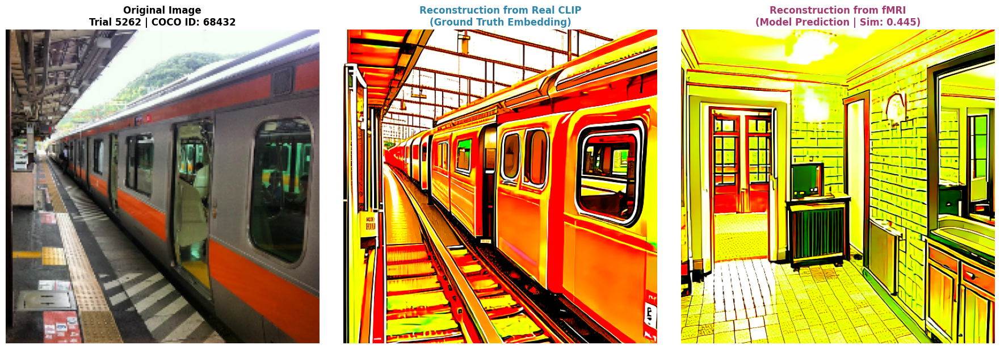

Validation Index: 1968 → Dataset Trial: 5262
Image ID: 68432
Cosine Similarity (Real vs Predicted CLIP): 0.4447

Reconstructing from Real CLIP embedding...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Reconstructing from Predicted CLIP embedding (fMRI)...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

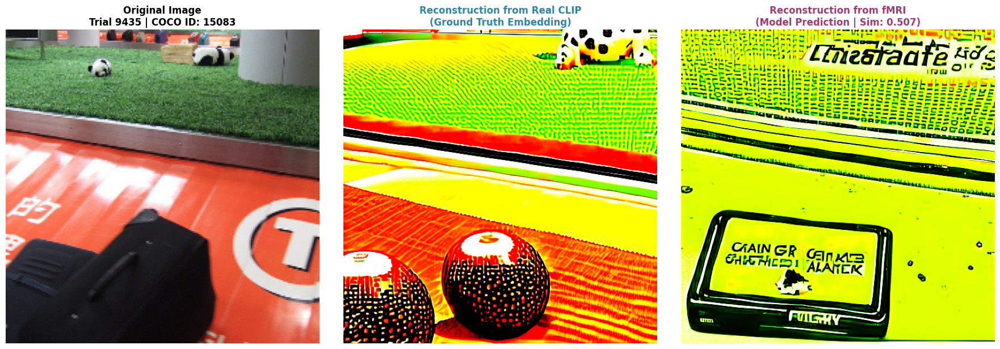

Validation Index: 3207 → Dataset Trial: 9435
Image ID: 15083
Cosine Similarity (Real vs Predicted CLIP): 0.5072

Reconstructing from Real CLIP embedding...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Reconstructing from Predicted CLIP embedding (fMRI)...


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

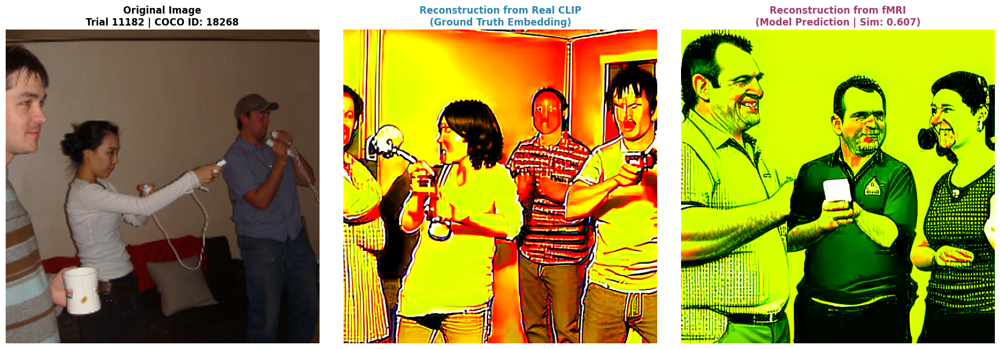

Validation Index: 3547 → Dataset Trial: 11182
Image ID: 18268
Cosine Similarity (Real vs Predicted CLIP): 0.6069



In [22]:
# ============================================================================
# IMAGE RECONSTRUCTION FROM CLIP EMBEDDINGS
# ============================================================================

def reconstruct_from_clip_embedding(clip_embedding, reference_image, 
                                    prior_pipe, decoder_pipe, vae, 
                                    strength=0.55, device="cuda", dtype=torch.float16):
    """
    Reconstruct an image from a CLIP embedding using Kandinsky pipeline
    
    Args:
        clip_embedding: CLIP embedding (768,) tensor
        reference_image: PIL Image to use as structural anchor
        prior_pipe, decoder_pipe, vae: Loaded Kandinsky models
        strength: Reconstruction strength (0.5-0.6 recommended)
    
    Returns:
        PIL Image of reconstruction
    """
    # 1. Get structural anchor from reference image
    img_tensor = decoder_pipe.image_processor.preprocess(reference_image).to(device, dtype=dtype)
    with torch.no_grad():
        latents = vae.encode(img_tensor).latent_dist.mode()
        anchor_tensor = vae.decode(latents).sample
        anchor_pil = decoder_pipe.image_processor.postprocess(anchor_tensor, output_type="pil")[0]
    
    # 2. Prepare CLIP embedding (ensure correct shape and device)
    image_embeds = clip_embedding.unsqueeze(0).to(device, dtype=dtype)
    
    # 3. Get negative embeddings
    with torch.no_grad():
        neg_out = prior_pipe(
            prompt="blue tint, cold colors, low quality, blurry",
            num_inference_steps=20
        )
    neg_emb = neg_out.image_embeds
    
    # 4. Reconstruct image
    with torch.no_grad():
        output = decoder_pipe(
            image=anchor_pil,
            image_embeds=image_embeds,
            negative_image_embeds=neg_emb,
            strength=strength,
            guidance_scale=12.0,
            num_inference_steps=30
        ).images[0]
    
    return output


def show_image_with_reconstructions(val_idx, dataset, val_indices, 
                                     clip_embeddings, predicted_embeddings,
                                     prior_pipe, decoder_pipe, vae,
                                     device="cuda", dtype=torch.float16):
    """
    Show original image + reconstruction from real CLIP + reconstruction from predicted CLIP
    
    Args:
        val_idx: Index into validation set
        dataset: Full MindEyeDataset
        val_indices: Validation trial indices
        clip_embeddings: Real CLIP embeddings
        predicted_embeddings: Model predictions
        prior_pipe, decoder_pipe, vae: Kandinsky models
    """
    # Get indices and sample
    actual_trial_idx = val_indices[val_idx]
    sample = dataset[actual_trial_idx]
    
    # Get embeddings
    real_clip = clip_embeddings[actual_trial_idx]
    pred_clip = predicted_embeddings[val_idx]
    
    # Compute similarity
    real_norm = real_clip / real_clip.norm()
    pred_norm = pred_clip / pred_clip.norm()
    cosine_sim = (real_norm * pred_norm).sum().item()
    
    # Convert original image to PIL
    original_np = sample['image'].permute(1, 2, 0).numpy()
    original_pil = Image.fromarray((original_np * 255).astype('uint8'))
    
    print(f"Reconstructing from Real CLIP embedding...")
    recon_from_real = reconstruct_from_clip_embedding(
        clip_embedding=real_clip,
        reference_image=original_pil,
        prior_pipe=prior_pipe,
        decoder_pipe=decoder_pipe,
        vae=vae,
        device=device,
        dtype=dtype
    )
    
    print(f"Reconstructing from Predicted CLIP embedding (fMRI)...")
    recon_from_pred = reconstruct_from_clip_embedding(
        clip_embedding=pred_clip,
        reference_image=original_pil,
        prior_pipe=prior_pipe,
        decoder_pipe=decoder_pipe,
        vae=vae,
        device=device,
        dtype=dtype
    )
    
    # ========== VISUALIZATION ==========
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # 1. Original Image
    axes[0].imshow(original_pil)
    axes[0].set_title(f"Original Image\n"
                      f"Trial {actual_trial_idx} | COCO ID: {sample['image_id']}", 
                      fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # 2. Reconstruction from Real CLIP
    axes[1].imshow(recon_from_real)
    axes[1].set_title(f"Reconstruction from Real CLIP\n"
                      f"(Ground Truth Embedding)", 
                      fontsize=12, fontweight='bold', color='#2E86AB')
    axes[1].axis('off')
    
    # 3. Reconstruction from Predicted CLIP
    axes[2].imshow(recon_from_pred)
    axes[2].set_title(f"Reconstruction from fMRI\n"
                      f"(Model Prediction | Sim: {cosine_sim:.3f})", 
                      fontsize=12, fontweight='bold', color='#A23B72')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"{'='*70}")
    print(f"Validation Index: {val_idx} → Dataset Trial: {actual_trial_idx}")
    print(f"Image ID: {sample['image_id']}")
    print(f"Cosine Similarity (Real vs Predicted CLIP): {cosine_sim:.4f}")
    print(f"{'='*70}\n")


# ============================================================================
# USAGE
# ============================================================================

# Show reconstructions for first validation sample
show_image_with_reconstructions(
    val_idx=0,
    dataset=dataset,
    val_indices=val_indices,
    clip_embeddings=clip_embeddings,
    predicted_embeddings=predicted_embeddings,
    prior_pipe=prior_pipe,
    decoder_pipe=decoder_pipe,
    vae=vae
)

# Show multiple random samples
print("\n" + "="*70)
print("SHOWING 3 RANDOM RECONSTRUCTIONS")
print("="*70 + "\n")

import random
for i in range(3):
    random_idx = random.randint(0, len(val_indices)-1)
    show_image_with_reconstructions(
        val_idx=random_idx,
        dataset=dataset,
        val_indices=val_indices,
        clip_embeddings=clip_embeddings,
        predicted_embeddings=predicted_embeddings,
        prior_pipe=prior_pipe,
        decoder_pipe=decoder_pipe,
        vae=vae
    )

Loading embeddings and models...
✓ Embeddings loaded


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Exception ignored in: <function MindEyeDataset.__del__ at 0x793ad7a6fec0>
Traceback (most recent call last):
  File "/tmp/ipykernel_55/2068780671.py", line 68, in __del__
AttributeError: 'MindEyeDataset' object has no attribute '_betas_file'


✓ Models loaded


Reconstructing Trial 1 (Val Index: 0)
Cosine Similarity: 0.6518

1/4: Reconstructing from Real embedding WITH spatial anchor...


  0%|          | 0/16 [00:00<?, ?it/s]

2/4: Reconstructing from Predicted embedding WITH spatial anchor...


  0%|          | 0/16 [00:00<?, ?it/s]

3/4: Reconstructing from Real embedding WITHOUT spatial anchor (pure)...


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

4/4: Reconstructing from Predicted embedding WITHOUT spatial anchor (pure)...


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

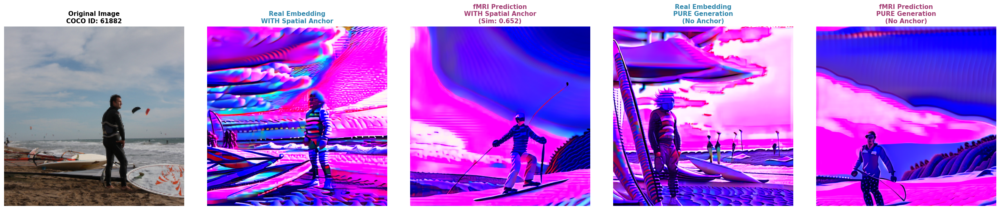


Validation Index: 0 → Dataset Trial: 1
Image ID: 61882
Cosine Similarity: 0.6518


SHOWING 3 RANDOM RECONSTRUCTIONS


Reconstructing Trial 19374 (Val Index: 554)
Cosine Similarity: 0.7099

1/4: Reconstructing from Real embedding WITH spatial anchor...


  0%|          | 0/16 [00:00<?, ?it/s]

2/4: Reconstructing from Predicted embedding WITH spatial anchor...


  0%|          | 0/16 [00:00<?, ?it/s]

3/4: Reconstructing from Real embedding WITHOUT spatial anchor (pure)...


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

4/4: Reconstructing from Predicted embedding WITHOUT spatial anchor (pure)...


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

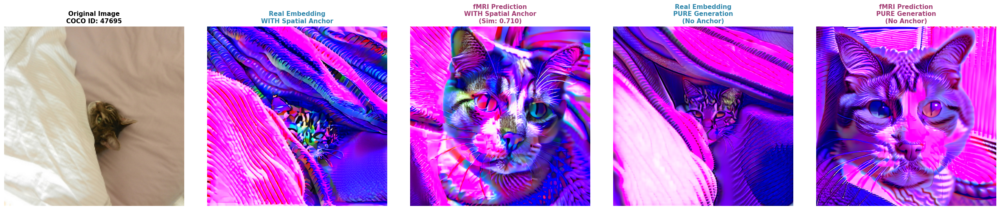


Validation Index: 554 → Dataset Trial: 19374
Image ID: 47695
Cosine Similarity: 0.7099


Reconstructing Trial 9375 (Val Index: 3195)
Cosine Similarity: 0.5376

1/4: Reconstructing from Real embedding WITH spatial anchor...


  0%|          | 0/16 [00:00<?, ?it/s]

2/4: Reconstructing from Predicted embedding WITH spatial anchor...


  0%|          | 0/16 [00:00<?, ?it/s]

3/4: Reconstructing from Real embedding WITHOUT spatial anchor (pure)...


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

4/4: Reconstructing from Predicted embedding WITHOUT spatial anchor (pure)...


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
import torch.nn.functional as F

# ============================================================================
# IMAGE RECONSTRUCTION - MULTIPLE METHODS
# ============================================================================

def reconstruct_with_anchor(kandinsky_embedding, reference_image, 
                            decoder_pipe, vae, 
                            strength=0.55, device="cuda", dtype=torch.float16):
    """
    Reconstruct using spatial anchor from original image (img2img approach)
    """
    # 1. Get structural anchor from reference image
    img_tensor = decoder_pipe.image_processor.preprocess(reference_image).to(device, dtype=dtype)
    with torch.no_grad():
        latents = vae.encode(img_tensor).latent_dist.mode()
        anchor_tensor = vae.decode(latents).sample
        anchor_pil = decoder_pipe.image_processor.postprocess(anchor_tensor, output_type="pil")[0]
    
    # 2. Prepare embedding
    image_embeds = kandinsky_embedding.unsqueeze(0).to(device, dtype=dtype)
    
    # 3. No negative embeddings - just zeros
    neg_emb = torch.zeros(1, 1280, device=device, dtype=dtype)
    
    # 4. Reconstruct
    with torch.no_grad():
        output = decoder_pipe(
            image=anchor_pil,
            image_embeds=image_embeds,
            negative_image_embeds=neg_emb,
            strength=strength,
            guidance_scale=12.0,
            num_inference_steps=30
        ).images[0]
    
    return output


def reconstruct_from_embedding_only(kandinsky_embedding, 
                                     height=512, width=512,
                                     device="cuda", dtype=torch.float16):
    """
    Pure reconstruction from embedding only - NO spatial anchor (text2img approach)
    """
    from diffusers import KandinskyV22Pipeline
    
    # Load text-to-image pipeline
    pipe = KandinskyV22Pipeline.from_pretrained(
        "kandinsky-community/kandinsky-2-2-decoder",
        torch_dtype=dtype
    )
    pipe.enable_model_cpu_offload()
    
    # Prepare embeddings
    image_embeds = kandinsky_embedding.unsqueeze(0).to(device, dtype=dtype)
    neg_emb = torch.zeros(1, 1280, device=device, dtype=dtype)
    
    # Generate from scratch
    with torch.no_grad():
        output = pipe(
            image_embeds=image_embeds,
            negative_image_embeds=neg_emb,
            height=height,
            width=width,
            num_inference_steps=50,
            guidance_scale=12.0
        ).images[0]
    
    return output


def show_all_reconstructions(val_idx, dataset, val_indices, 
                             kandinsky_embeddings, predicted_embeddings,
                             decoder_pipe, vae,
                             device="cuda", dtype=torch.float16):
    """
    Show 5 versions:
    1. Original image
    2. Reconstruction from real embedding WITH spatial anchor
    3. Reconstruction from predicted embedding WITH spatial anchor
    4. Reconstruction from real embedding WITHOUT spatial anchor (pure)
    5. Reconstruction from predicted embedding WITHOUT spatial anchor (pure)
    """
    # Get indices and sample
    actual_trial_idx = val_indices[val_idx]
    sample = dataset[actual_trial_idx]
    
    # Get embeddings
    real_emb = kandinsky_embeddings[actual_trial_idx]
    pred_emb = predicted_embeddings[val_idx]
    
    # Compute similarity
    cosine_sim = F.cosine_similarity(
        real_emb.unsqueeze(0), 
        pred_emb.unsqueeze(0)
    ).item()
    
    # Convert original image to PIL
    original_np = sample['image'].permute(1, 2, 0).numpy()
    original_pil = Image.fromarray((original_np * 255).astype('uint8'))
    
    print(f"\n{'='*70}")
    print(f"Reconstructing Trial {actual_trial_idx} (Val Index: {val_idx})")
    print(f"Cosine Similarity: {cosine_sim:.4f}")
    print(f"{'='*70}\n")
    
    # 2. With spatial anchor - Real embedding
    print("1/4: Reconstructing from Real embedding WITH spatial anchor...")
    recon_real_anchor = reconstruct_with_anchor(
        kandinsky_embedding=real_emb,
        reference_image=original_pil,
        decoder_pipe=decoder_pipe,
        vae=vae,
        device=device,
        dtype=dtype
    )
    
    # 3. With spatial anchor - Predicted embedding
    print("2/4: Reconstructing from Predicted embedding WITH spatial anchor...")
    recon_pred_anchor = reconstruct_with_anchor(
        kandinsky_embedding=pred_emb,
        reference_image=original_pil,
        decoder_pipe=decoder_pipe,
        vae=vae,
        device=device,
        dtype=dtype
    )
    
    # 4. Without spatial anchor - Real embedding (PURE brain decoding)
    print("3/4: Reconstructing from Real embedding WITHOUT spatial anchor (pure)...")
    recon_real_pure = reconstruct_from_embedding_only(
        kandinsky_embedding=real_emb,
        height=512,
        width=512,
        device=device,
        dtype=dtype
    )
    
    # 5. Without spatial anchor - Predicted embedding (PURE brain decoding)
    print("4/4: Reconstructing from Predicted embedding WITHOUT spatial anchor (pure)...")
    recon_pred_pure = reconstruct_from_embedding_only(
        kandinsky_embedding=pred_emb,
        height=512,
        width=512,
        device=device,
        dtype=dtype
    )
    
    # ========== VISUALIZATION ==========
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    
    # 1. Original Image
    axes[0].imshow(original_pil)
    axes[0].set_title(f"Original Image\n"
                      f"COCO ID: {sample['image_id']}", 
                      fontsize=11, fontweight='bold')
    axes[0].axis('off')
    
    # 2. Real + Anchor
    axes[1].imshow(recon_real_anchor)
    axes[1].set_title(f"Real Embedding\n"
                      f"WITH Spatial Anchor", 
                      fontsize=11, fontweight='bold', color='#2E86AB')
    axes[1].axis('off')
    
    # 3. Predicted + Anchor
    axes[2].imshow(recon_pred_anchor)
    axes[2].set_title(f"fMRI Prediction\n"
                      f"WITH Spatial Anchor\n(Sim: {cosine_sim:.3f})", 
                      fontsize=11, fontweight='bold', color='#A23B72')
    axes[2].axis('off')
    
    # 4. Real + Pure
    axes[3].imshow(recon_real_pure)
    axes[3].set_title(f"Real Embedding\n"
                      f"PURE Generation\n(No Anchor)", 
                      fontsize=11, fontweight='bold', color='#2E86AB')
    axes[3].axis('off')
    
    # 5. Predicted + Pure
    axes[4].imshow(recon_pred_pure)
    axes[4].set_title(f"fMRI Prediction\n"
                      f"PURE Generation\n(No Anchor)", 
                      fontsize=11, fontweight='bold', color='#A23B72')
    axes[4].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n{'='*70}")
    print(f"Validation Index: {val_idx} → Dataset Trial: {actual_trial_idx}")
    print(f"Image ID: {sample['image_id']}")
    print(f"Cosine Similarity: {cosine_sim:.4f}")
    print(f"{'='*70}\n")


# ============================================================================
# USAGE
# ============================================================================

# Load all required components
print("Loading embeddings and models...")

# Load embeddings
kandinsky_embeddings = torch.load('/kaggle/input/kandinsky-embeddings-truth/kandinsky_embeddings_subj01.pt')
if kandinsky_embeddings.dtype == torch.float16:
    kandinsky_embeddings = kandinsky_embeddings.float()

model_data = torch.load('/kaggle/input/kandinsky-embeddings-model/model_outputs_kandinsky.pt')
predicted_embeddings = model_data['embeddings']

print(f"✓ Embeddings loaded")

# Load models
from diffusers import KandinskyV22Img2ImgPipeline, AutoencoderKL

device = 'cuda' if torch.cuda.is_available() else 'cpu'
dtype = torch.float16

decoder_pipe = KandinskyV22Img2ImgPipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder", 
    torch_dtype=dtype
)
decoder_pipe.enable_model_cpu_offload()

vae = AutoencoderKL.from_pretrained(
    "runwayml/stable-diffusion-v1-5", 
    subfolder="vae", 
    torch_dtype=dtype
).to(device)

print(f"✓ Models loaded\n")

# Show first validation sample with all 5 reconstructions
show_all_reconstructions(
    val_idx=0,
    dataset=dataset,
    val_indices=val_indices,
    kandinsky_embeddings=kandinsky_embeddings,
    predicted_embeddings=predicted_embeddings,
    decoder_pipe=decoder_pipe,
    vae=vae
)

# Show 3 random samples
print("\n" + "="*70)
print("SHOWING 3 RANDOM RECONSTRUCTIONS")
print("="*70 + "\n")

import random
for i in range(3):
    random_idx = random.randint(0, len(val_indices)-1)
    show_all_reconstructions(
        val_idx=random_idx,
        dataset=dataset,
        val_indices=val_indices,
        kandinsky_embeddings=kandinsky_embeddings,
        predicted_embeddings=predicted_embeddings,
        decoder_pipe=decoder_pipe,
        vae=vae
    )